# TP 1 - EXTRACTION DE L'INFORMATION : VIDEO

Nour Elhouda KIRED -
Valentine ROSSI -
Théo VEDIS


In [1]:
import matplotlib.pyplot as plt
import numpy as np
!pip install tqdm
from tqdm.notebook import tqdm # Permet d'avoir une barre de chargement
# Si ca ne marche pas
# from tqdm import tqdm

### Question 1

Shape : (200, 200, 3)


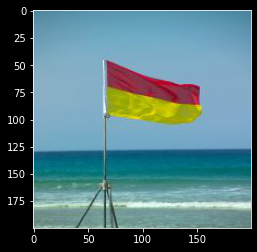

In [2]:
img = plt.imread('Images/45.jpg')
plt.imshow(img)
print("Shape :", img.shape) 
# Tableau a 3 dimension, les deux premieres correspondent a la taille (hauteur, largeur) de l'image et la troisieme aux couleurs RGB
# 200x200 pixels et 3 canaux pour les couleurs

### Question 2

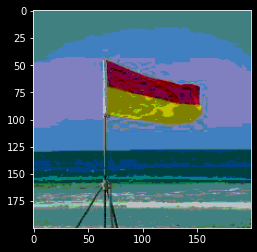

In [3]:
imgQt = np.bitwise_and(img, 128 + 64)
plt.imshow(imgQt)
# On se retrouve avec 64 (2^(2+2+2)) couleurs possible au lieu de 16 millions (2^(8+8+8))
# On a moins de nuance de couleurs!

In [4]:
def rmse(img1, img2):
    err = 0
    for i in range(len(img1)):
        for j in range(len(img1[i])):
            for k in range(len(img1[i][j])):
                err += (img1[i][j][k] - img2[i][j][k])**2
    n = 1
    for i in img1.shape:
        n = n * i
    return np.sqrt(err / n)

print("Rmse : ", rmse(img, imgQt))
# L'erreur est relativement faible, on perd de l'information mais cela reste correcte, on reconnait toujours l'image!

Rmse :  36.29945993629474


### Question 3

[[26 26 26 ... 26 26 26]
 [26 26 26 ... 26 26 26]
 [26 26 26 ... 26 26 26]
 ...
 [26 26 26 ... 26 26 25]
 [42 42 42 ... 25 25 25]
 [42 42 42 ... 21 21 25]]


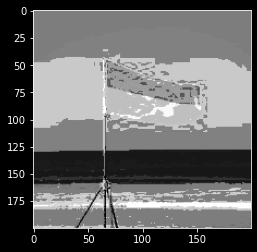

In [5]:
def quantification(img):
    imgQt = np.bitwise_and(img, 128 + 64)
    imgQuantif = []
    for i in range(len(imgQt)):
        imgQuantif.append([])
        for j in range(len(imgQt[i])):
            val = ''
            for k in range(len(imgQt[i][j])):
                el = imgQt[i][j][k]
                if el // 128 == 1:
                    val += '1'
                    el -= 128
                else:
                    val += '0'
                
                if el // 64 == 1:
                    val += '1'
                else:
                    val += '0'
            imgQuantif[i].append(int(val, 2))
    return np.array(imgQuantif)

def quantificationV2(img, nb=2, nbbit=8):
    imgQuantif = []
    for i in range(len(img)):
        imgQuantif.append([])
        for j in range(len(img[i])):
            imgQuantif[i].append(0)
            for k in range(len(img[i][j])):
                imgQuantif[i][j] += (img[i][j][k] >> (nbbit - nb)) << (nb*(2-k))
    
    return np.array(imgQuantif)

# imgQt2 = quantification(img)
# print(imgQt2)
# plt.imshow(imgQt2, cmap = 'Greys_r')
# plt.show()
imgQt3 = quantificationV2(img, nb=2)
print(imgQt3)
plt.imshow(imgQt3, cmap = 'Greys_r')

### Question 4

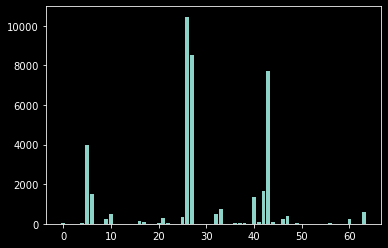

In [6]:
def histogramme(img, nb=6):
    """
        Prend une image quantifiée en entrée!
        nb = nombre de bit total pour les canaux
    """
    histo = np.zeros(2**nb, dtype=int)
    for line in img:
        for i in line:
            histo[i] += 1
    return histo

plt.bar(np.array(range(0,64)), histogramme(imgQt3))
plt.show()
# On remarque que 26, 27, 43 sont les nuances de gris les plus présentes dans l'images
# 26 et 27 correspondent a un gris "moyen" => haut et bas du ciel
# a 43 on a un gris plus claire => le milieu du ciel
# a 5 on a un gris très foncé => la mer
# 0 correspond au noir et 63 au blanc

In [7]:
# Convertisseur nuances de gris => 3 canal RGB

val = 63
binar = bin(val)[2:]
print(binar)
try:
    r = int(binar[-6:-4], 2) * 64
except:
    r = 0
try:
    v = int(binar[-4:-2], 2) * 64
except:
    v = 0
try:
    b = int(binar[-2:], 2) * 64
except:
    b = 0
r, v, b

111111


(192, 192, 192)

### Question 5

In [8]:
import os

images_paths = ["./images/" + f for f in os.listdir("./images/") if f[-4:] == ".jpg"]
# print(images_paths)

images = {}
# Le dictionnaire contenant toutes les images initiales
for img_path in images_paths:
    images[img_path[len("./images/"):-4]] = plt.imread(img_path)

def indexation(images, nb=2, nbCanaux=3):
    histos = {}
    for key, img in tqdm(images.items()):
        histos[key] = (histogramme(quantificationV2(img, nb=nb), nb=nb*nbCanaux))
    return histos

histos = indexation(images)
# Histos le dictionnaire contenant tous les histogrammes de chaque image

### Question 6

In [9]:
def distanceHisto(h1, h2):
    """
        Fonction qui prend 2 histogramme
        et renvoie leur distance
    """
    val = 0
    for i in range(len(h1)):
        val += min(h1[i], h2[i])
    return val

print("Distance entre 01 et 02: ", distanceHisto(histos["01"], histos["02"]))

def dstIntersect(histos, fct=distanceHisto):
    """
        Renvoies la matrice des distances entre les histos au sens des intersections
    """
    dst = {}
    for key1, histo1  in histos.items():
        dst[key1] = {}
        for key2, histo2 in histos.items():
            if key1 != key2:
                dst[key1][key2] = fct(histos[key1], histos[key2])
            else:
                dst[key1][key2] = 0
    return dst

dst = dstIntersect(histos)
# dst le double dictionnaire des distances entre les histogrammes

Distance entre 01 et 02:  24595


In [10]:
def imgProche(imgName, dst, n=5):
    """
        Effectue un tri sur les distances pour une image donnée et renvoie les n premiers noms d'image
        imgName : Nom de l'image
        dst : double dictionnaire des distances des images
        n : nombre de noms en sortie
        Sortie => Une liste triée contenant les noms des images les plus proches
    """
    return sorted(dst[imgName].keys(), key=lambda x: -dst[imgName][x])[:n]

print("Image proche de l'image 38 :", *imgProche("38", dst))

Image proche de l'image 38 : 03 43 17 30 50


### Question 7

In [11]:
# Calcul de la matrice des distances en prenant 3 bits fort
histosB3 = indexation(images, nb=3)
dstB3 = dstIntersect(histosB3)

In [12]:
fig = plt.figure(figsize=(200,200))
i = 1
for name, img in images.items():
    ax = fig.add_subplot(10, 5, i)
    ax.imshow(img)
    ax.title.set_text(name)
    ax.title.set_size(200)
    i += 1

fig.show()
# Affichage des images !

In [13]:
"""
    Affichage des images 38, 44 et leurs images proches
    pour une quantification sur 2 et 3 bits de poids fort
"""

nom = "38"
print("3 bit:", *imgProche(nom, dst=dstB3))
print("2 bit:", *imgProche(nom, dst=dst))
print("---------------------")
nom2 = "44"
print("3 bit:", *imgProche(nom2, dst=dstB3))
print("2 bit:", *imgProche(nom2, dst=dst))

3 bit: 03 30 17 15 42
2 bit: 03 43 17 30 50
---------------------
3 bit: 47 13 26 46 45
2 bit: 13 26 47 22 46
